In [798]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [799]:
import os
import sys
sys.path.append(os.path.join(os.getcwd(), '../'))

In [800]:
import os
import sys
import math
import aiohttp
import asyncio
import requests
from datetime import datetime

import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patheffects as pe
import xarray as xr
import dask.array as da

from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit

from io import StringIO
from datetime import datetime, date
from typing import Literal
from icecream import ic
import time
from IPython.display import display, Math

from src.hourly_consumption_generator import HourlyConsumptionDataGenerator
from src.wind_data_downloader import WindDataDownloader
from src.battery_model import simulate_battery_system_xr
from src.components_data import inverter_data, generator_data, mast_data, controller_data

In [156]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams.update({
    'font.size': 12,
    'axes.labelsize': 13,
    'axes.titlesize': 14,
    'legend.fontsize': 11,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11
})

## Функции и переменные, которые могут пригодится по ходу работы.

In [7]:
def df_to_latex(df, filename, caption="", position="h", index=False, float_format="%.1f"):
    latex_code = df.to_latex(index=index, caption=caption, position=position, float_format=float_format)
    lines = latex_code.splitlines()
    lines.insert(1, r"\centering")
    final_code = "\n".join(lines)
    with open(f"../doc/tables/{filename}.tex", "w", encoding="utf-8") as f:
        f.write(final_code)

In [8]:
def df_cache_process(func, cache_file, cache_path='../data'):
    path = os.path.join(cache_path, cache_file)
    if os.path.exists(path):
        return pd.read_csv(path, index_col=0, parse_dates=True)

    df = func()
    df.to_csv(path)
    return df

In [276]:
def latex_sci(x, digits=2):
    if x == 0:
        return "0"
    exp = int(np.floor(np.log10(abs(x))))
    mant = x / 10**exp
    return rf'{mant:.{digits}f}\cdot 10^{{{exp}}}'

In [535]:
def printl(text):
    display(Math(text))

In [9]:
figsize = (7.5, 4)
figsize_long = (12, 4.5)
figsize_big = (15, 8)

## Определение характеристик ветра

### Данные

In [218]:
city_coords = {
    "Казань": (49.1114975, 55.7943584),
    "Набережные Челны": (52.3959165, 55.7434619),
    'Таганрог': (38.9350989, 47.2094917),
}

In [219]:
wind_data_downloader = WindDataDownloader(zarr_path='../data/wind_data_my', city_coords=city_coords)
await wind_data_downloader.download_cities_to_zarr(start_year=2001, end_year=2024, heights=np.array([10, 50]))

/Users/user/.venvs/lib/python3.13/site-packages/zarr/core/dtype/npy/string.py:249: UnstableSpecificationWarning: The data type (FixedLengthUTF32(length=16, endianness='little')) does not have a Zarr V3 specification. That means that the representation of arrays saved with this data type may change without warning in a future version of Zarr Python. Arrays stored with this data type may be unreadable by other Zarr libraries. Use this data type at your own risk! Check https://github.com/zarr-developers/zarr-extensions/tree/main/data-types for the status of data type specifications for Zarr V3.
  v3_unstable_dtype_warning(self)
/Users/user/.venvs/lib/python3.13/site-packages/zarr/api/asynchronous.py:247: ZarrUserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(
/Users/user/.venvs/lib/python3.13/site-packages/zarr/core/dtype/npy/string.py:249: Unstable

Батч 1 готов


In [10]:
wind_data_all = xr.open_zarr('../data/wind_data_my').wind_data

In [223]:
arr_10_50 = (np.log(wind_data_all.sel(height=10).mean(dim='time') / wind_data_all.sel(height=50).mean(dim='time')) / np.log(10/50))
h = 30
wind_data_all_20 = (1/2) * (wind_data_all.sel(height=10) * (h / 10) ** arr_10_50 + wind_data_all.sel(height=50) * (h / 50) ** arr_10_50)
wind_data_all_20 = wind_data_all_20.expand_dims(height=[h])
wind_data_all_20.to_zarr('../data/wind_data_my', mode='a', append_dim='height')

/Users/user/.venvs/lib/python3.13/site-packages/zarr/api/asynchronous.py:247: ZarrUserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(
/Users/user/.venvs/lib/python3.13/site-packages/zarr/core/dtype/npy/string.py:249: UnstableSpecificationWarning: The data type (FixedLengthUTF32(length=16, endianness='little')) does not have a Zarr V3 specification. That means that the representation of arrays saved with this data type may change without warning in a future version of Zarr Python. Arrays stored with this data type may be unreadable by other Zarr libraries. Use this data type at your own risk! Check https://github.com/zarr-developers/zarr-extensions/tree/main/data-types for the status of data type specifications for Zarr V3.
  v3_unstable_dtype_warning(self)


In [11]:
wind_data_all = wind_data_all.sel(height=[10, 20, 30])

In [12]:
wind_data = wind_data_all.sel(city=['Казань', 'Набережные Челны', 'Таганрог'], height=[10, 20, 30]).compute()

### Таблицы

In [133]:
wind_data_all.mean(dim='time').to_pandas().round(2).sort_values(by=10, ascending=False).reset_index().to_csv('../data/mean_wind_speed.csv', index=True)

In [134]:
wind_data_all.quantile(dim='time', q=0.5).to_pandas().sort_values(by=20, ascending=False).round(2).reset_index().to_csv('../data/mode_wind_speed.csv', index=True)

In [135]:
df = wind_data_all.quantile(dim='time', q=0.5).to_pandas().sort_values(by=20, ascending=False).round(2)

In [137]:
df_to_latex(pd.concat([df.head(10), df.tail(10)]), '1_most_windy_cityes_Russia', 'Самые ветреные города России', index=True)

### Графики

Text(0, 0.5, 'Разница средней скоростью ветра между первой половине данных и во второй')

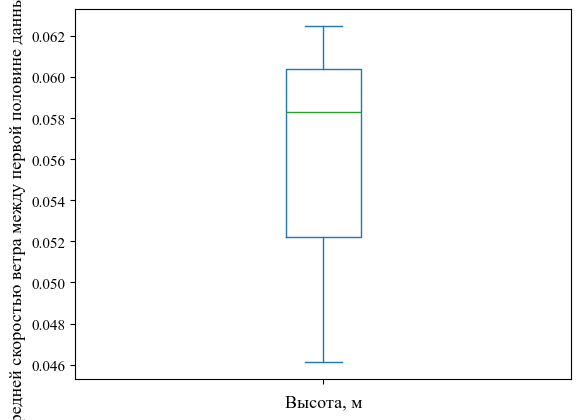

In [61]:
da = (
        wind_data_all.sel(time=slice('01.01.2013', '01.01.2025')).groupby('city').mean(dim='time') 
        - wind_data_all.sel(time=slice('01.01.2001', '01.01.2013')).groupby('city').mean(dim='time')
    ).compute()
da.to_pandas().mean().plot(kind='box')
plt.xlabel('Высота, м')
plt.ylabel('Разница средней скоростью ветра между первой половине данных и во второй')

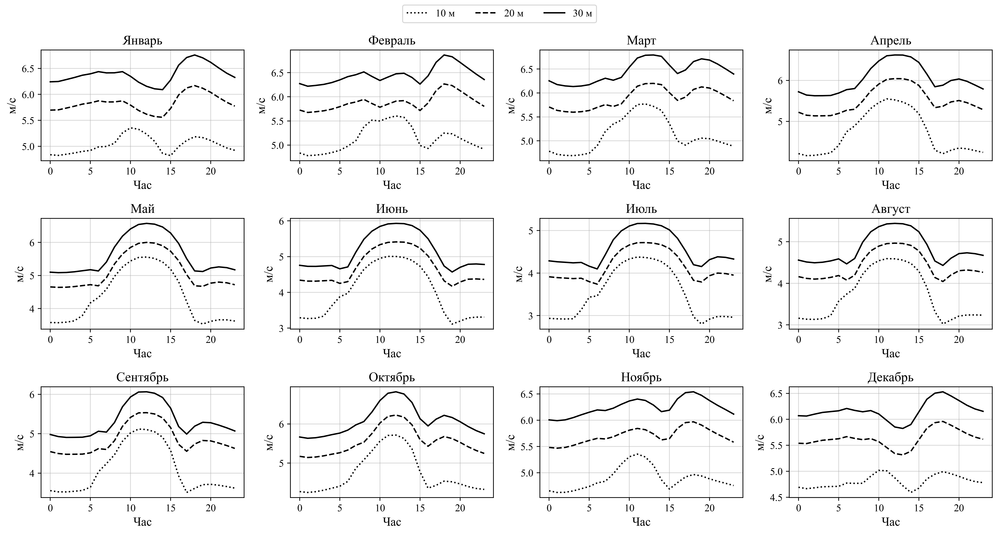

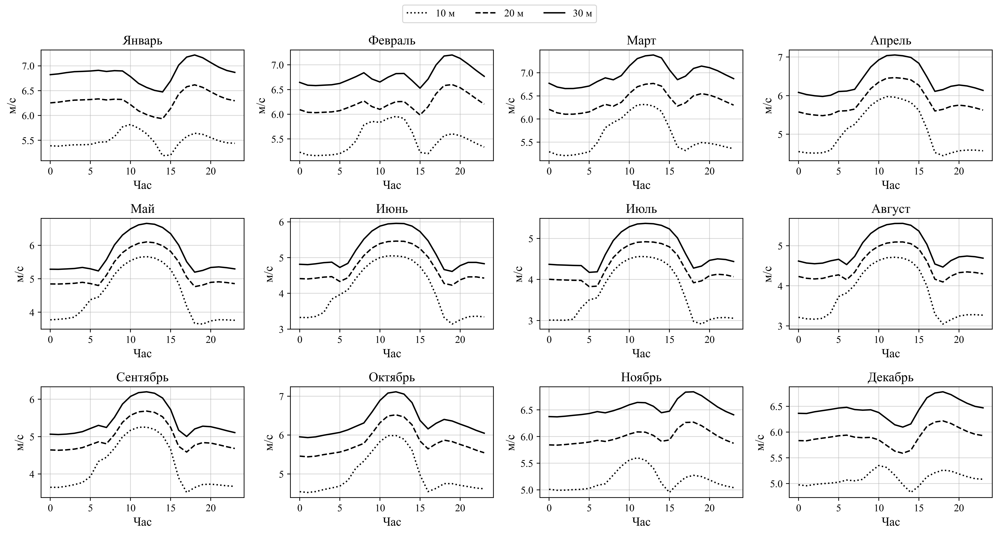

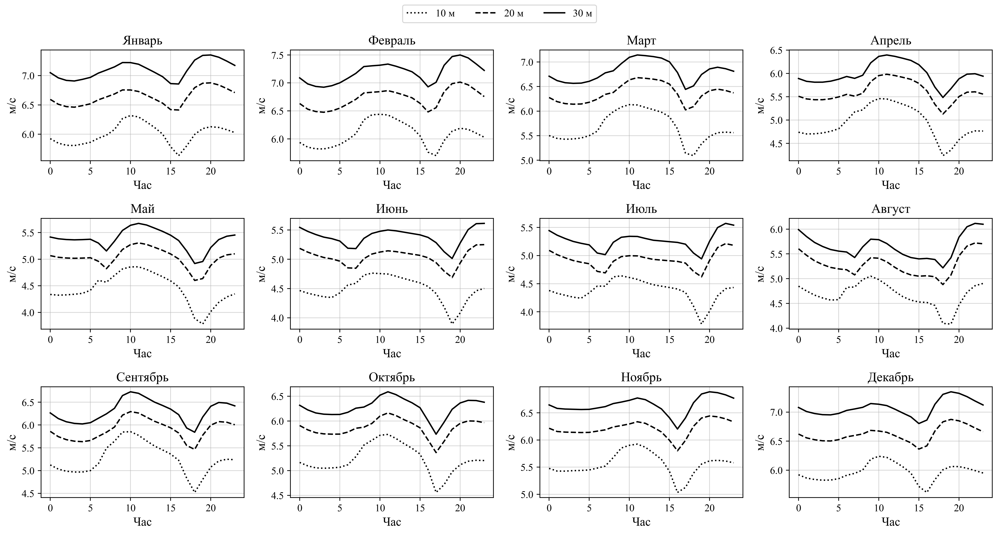

In [154]:
month_name = [
    "Январь", "Февраль", "Март", "Апрель",
    "Май", "Июнь", "Июль", "Август",
    "Сентябрь", "Октябрь", "Ноябрь", "Декабрь"
]

for city in wind_data.city.values:
    fig, axs = plt.subplots(3, 4, figsize=figsize_big, dpi=500)
    da = wind_data.sel(city=city)

    for i, ax in enumerate(axs.flatten()):
        month = i + 1
        temp = da.sel(time=da.time.dt.month == month)
        graph = temp.groupby(temp.time.dt.hour).mean()

        for h, style in zip([10,20,30], [":k", "--k", "-k"]):
            ax.plot(graph.sel(height=h), style, label=f"{h} м")

        ax.set_title(f'{month_name[month - 1]}')
        ax.set_xlabel('Час')
        ax.set_ylabel('м/с')
        ax.grid(alpha=0.5)

    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=3)
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    fig.savefig(f"../doc/figures/1_Средняя скорость ветра в городе {city}.png")


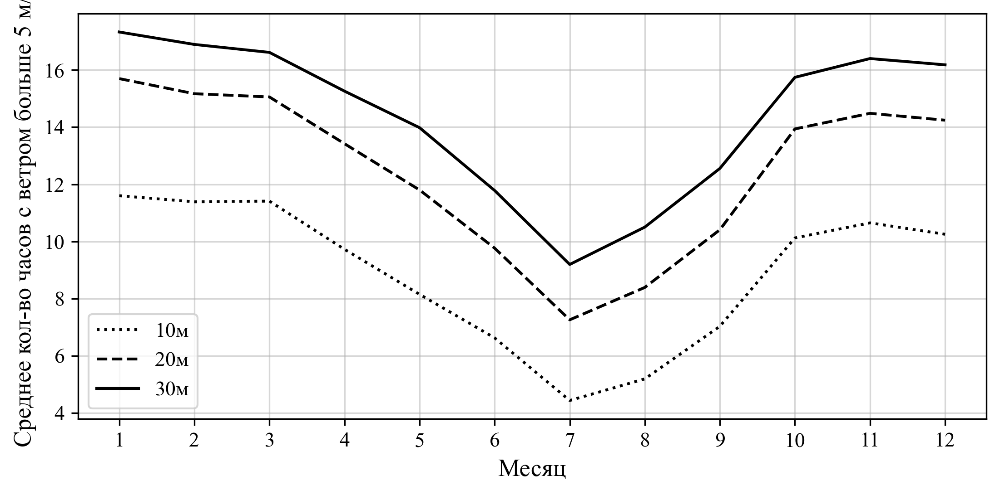

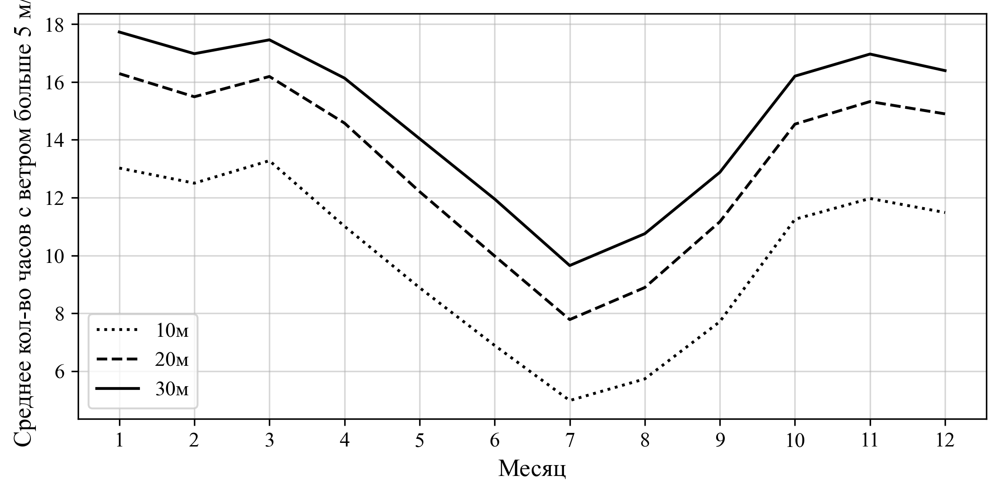

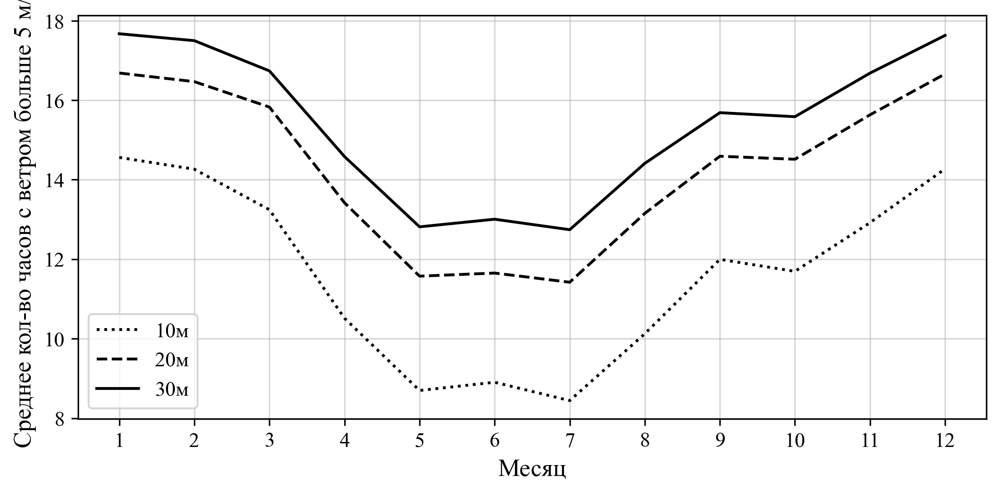

In [155]:
wind_speed_lim = 5

for city in wind_data.city.values:
    fig, ax = plt.subplots(figsize=figsize, dpi=300)

    da = wind_data.sel(city=city)

    da = wind_data.sel(city=city)
    mask = da > wind_speed_lim
    daily = mask.resample(time="1D").sum()
    monthly = daily.groupby("time.month").mean()

    months = range(1, 13)
    for h, style in zip([10, 20, 30], [":k", "--k", "-k"]):
        data = monthly.sel(height=h)
        ax.plot(months, data, style)
    
    ax.legend(['10м', '20м', '30м'])
    ax.set_xticks(months)

    plt.xlabel('Месяц')
    plt.ylabel(f'Среднее кол-во часов с ветром больше {wind_speed_lim} м/с')
    plt.grid(alpha=0.5)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"../doc/figures/1_Среднее кол-во часов с ветром больше {wind_speed_lim} м:с в городе {city}");

## Расчеты пиковой мощности и потребляемой мощности

### Определение таблиц

In [13]:
periods = ['Утро', 'День', 'Вечер', 'Ночь']

columns = ['Электроприборы', 'Вт', 'Утро', 'День', 'Вечер', 'Ночь']

appliance_usage_patterns = pd.DataFrame([
    ['Телевизор', 300, 0, 300, 300, 300],
    ['Освещение внутри', 300, 300, 0, 300, 300],          
    ['Освещение снаружи', 200, 0, 0, 200, 200],
    ['Насос', 700, 700, 700, 700, 700],  
    ['Строительные приборы', 2000, 0, 2000, 0, 0],   
    ['Утюг', 2000, 2000, 0, 2000, 2000],
    ['Ноутбук', 180, 180, 180, 180, 180],                    
    ['Компьютер', 650, 650, 650, 650, 650],                 
    ['Микроволновая печь', 1200, 1200, 1200, 1200, 1200],
    ['Фен', 1800, 1800, 0, 0, 1800],
    ['Холодильник', 150, 150, 150, 150, 150],               
    ['Другие кухонные приборы', 1000, 0, 0, 1000, 1000],  
    ['Телефон', 45, 45, 45, 45, 45],
    ['Стиральная машина', 1500, 1500, 0, 0, 0],
    ['Другие приборы', 300, 300, 300, 300, 300]
], columns=columns)

P_dayparts = pd.Series({period: appliance_usage_patterns.loc[appliance_usage_patterns[period] > 0, 'Вт'].sum() for period in periods})

P_dayparts_max = max(P_dayparts)

In [14]:
period_hours_mapping = {
    "Утро": range(1, 10),    # 1–9
    "День": range(10, 16),   # 10–15
    "Вечер": range(16, 20),  # 16–23
    "Ночь": [20, 21, 22, 23, 0]          
}

appliance_usage_hours = pd.DataFrame([
    ['Телевизор', 300, 0.5, 1, 2, 2],
    ['Освещение внутри', 300, 2.5, 0.2, 3, 4],          
    ['Освещение снаружи', 200, 0, 0, 0.5, 0.5],
    ['Насос', 700, 0.4, 0.4, 0.4, 0.4],  
    ['Строительные приборы', 2000, 0.2, 1, 0.2, 0.2],   
    ['Утюг', 2000, 0.2, 0, 0.2, 0.2],
    ['Ноутбук', 180, 0.2, 0.2, 0.2, 2],                    
    ['Компьютер', 650, 2, 1, 3, 3],                 
    ['Микроволновая печь', 1200, 0.3, 0.3, 0.3, 0.3],
    ['Фен', 1800, 0.1, 0, 0, 0.1],
    ['Холодильник', 150, 1.5, 2, 1, 1.5],               
    ['Другие кухонные приборы', 1000, 0, 0, 0.5, 0.5],  
    ['Телефон', 45, 1, 1, 1, 1],
    ['Стиральная машина', 1200, 0.2, 0, 0, 0],
    ['Другие приборы', 300, 2, 2, 2, 2]
], columns=columns)

daily_energy_per_appliance = (appliance_usage_hours['Вт'] * appliance_usage_hours[periods].sum(axis=1))
daily_energy_per_appliance.index = appliance_usage_hours.iloc[:, 0].values

E_day = daily_energy_per_appliance.sum()
print(E_day)

23118.0


In [810]:
generator = HourlyConsumptionDataGenerator(wind_data.time, appliance_usage_hours, period_hours_mapping)
hourly_consumption = generator.get_hourly_consumption()

### Графики

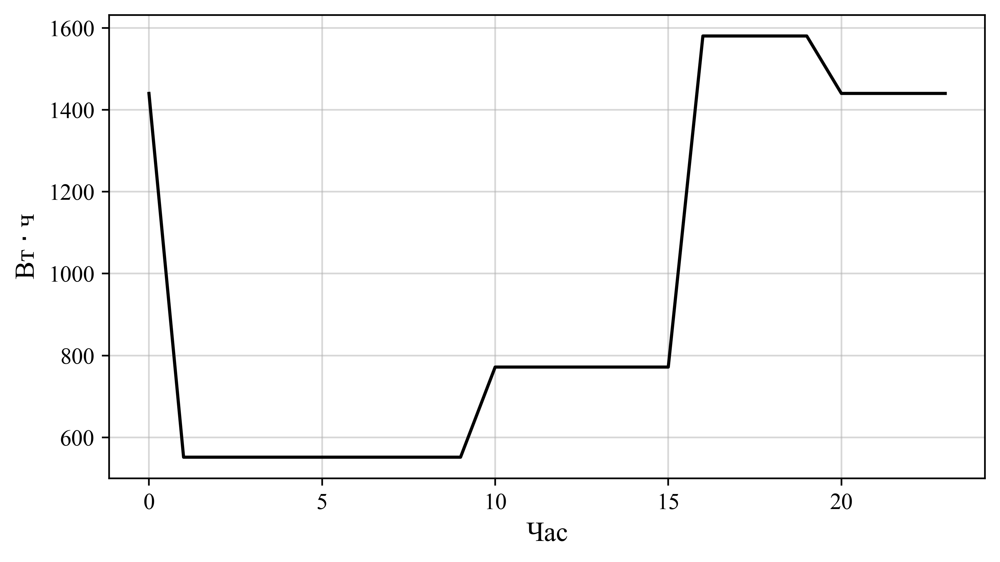

In [ ]:
# создаем 24-часовой профиль
consumption_curve = pd.Series(0.0, index=range(24))

# для каждого прибора распределяем мощность по часам
for _, row in appliance_usage_hours.iterrows():
    power = row['Вт']
    for period_name, hours in period_hours_mapping.items():
        usage_hours = row[period_name]
        if usage_hours == 0:
            continue

        # равномерно распределяем потребление внутри периода
        hours = list(hours)
        energy_per_hour = (power * usage_hours) / len(hours)  # Вт·ч на каждый час
        consumption_curve[hours] += energy_per_hour

plt.figure(figsize=figsize, dpi=500)
consumption_curve.plot(color='Black')
plt.xlabel('Час')
plt.ylabel(r'Вт $\cdot$ ч')
plt.grid(alpha=0.5);
plt.savefig('../doc/figures/2_Профиль энергопотребления')

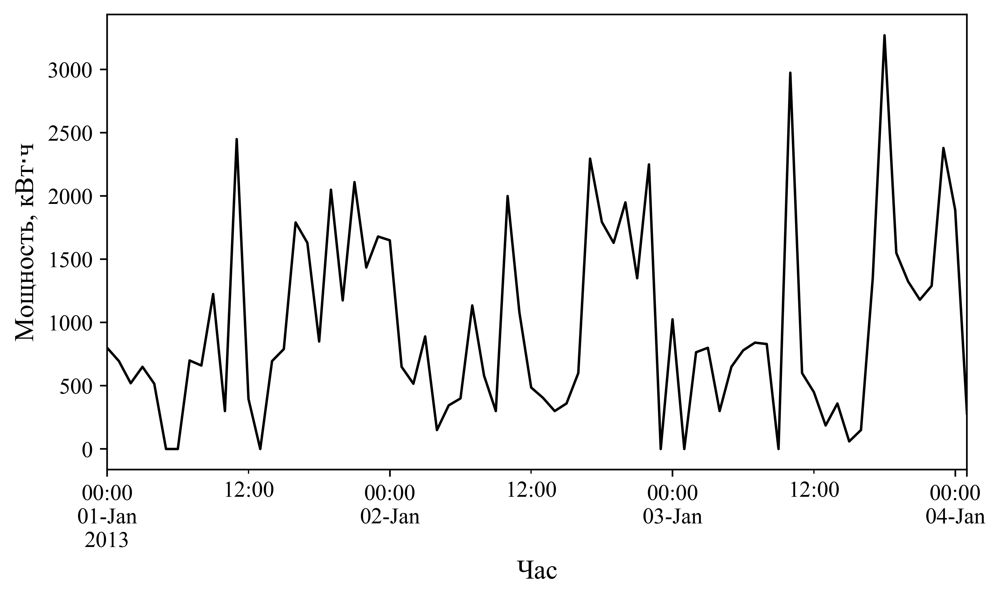

In [814]:
df = hourly_consumption.sel(time=slice('01.01.2013', '01.04.2013-01:00')).to_pandas()
plt.figure(figsize=figsize, dpi=500)
ax = plt.axes()
df.plot(ax = ax, color='black', linewidth=1.2)
ax.set_ylabel(r'Мощность, кВт$\cdot$ч');
ax.set_xlabel(r'Час');
plt.savefig('../doc/figures/2_Профиль энергопотребления за 3 дня', bbox_inches='tight')

### Сохранение таблиц и графиков

In [815]:
new_columns = pd.MultiIndex.from_tuples([
    ('Электроприборы', ''),
    ('Вт', ''),
    ('Мгновенная потребляемая мощность, Вт', 'Утро'),
    ('Мгновенная потребляемая мощность, Вт', 'День'),
    ('Мгновенная потребляемая мощность, Вт', 'Вечер'),
    ('Мгновенная потребляемая мощность, Вт', 'Ночь')
])

# Применяем мультииндекс к DataFrame
appliance_usage_patterns.columns = new_columns

# Теперь можно работать с таблицей как обычно
appliance_usage_patterns

Электроприборы    Вт Мгновенная потребляемая мощность, Вт        \
                                                                  Утро  День   
0                 Телевизор   300                                    0   300   
1          Освещение внутри   300                                  300     0   
2         Освещение снаружи   200                                    0     0   
3                     Насос   700                                  700   700   
4      Строительные приборы  2000                                    0  2000   
5                      Утюг  2000                                 2000     0   
6                   Ноутбук   180                                  180   180   
7                 Компьютер   650                                  650   650   
8        Микроволновая печь  1200                                 1200  1200   
9                       Фен  1800                                 1800     0   
10              Холодильник   150                                  150   150   
11  Другие кухонные приборы  1000                                    0     0   
12                  Телефон    45                                   45    45   
13        Стиральная машина  1500                                 1500     0   
14           Другие приборы   300                                  300   300   

                
   Вечер  Ночь  
0    300   300  
1    300   300  
2    200   200  
3    700   700  
4      0     0  
5   2000  2000  
6    180   180  
7    650   650  
8   1200  1200  
9      0  1800  
10   150   150  
11  1000  1000  
12    45    45  
13     0     0  
14   300   300

In [816]:
df_to_latex(P_dayparts, 'P_dayparts', 'Мгновенная мощность, Вт', index=True)

In [817]:
appliance_usage_hours['Потребление, Вт*ч'] = (appliance_usage_hours['Вт'] * appliance_usage_hours[periods].sum(axis=1))

In [818]:
new_columns = pd.MultiIndex.from_tuples([
    ('Электроприборы', ''),
    ('Вт', ''),
    ('Время использования T, ч', 'Утро 1ч'),
    ('Время использования T, ч', 'День 10ч'),
    ('Время использования T, ч', 'Вечер 4ч'),
    ('Время использования T, ч', 'Ночь 8ч'),
    ('Потребление, Вт*ч', '')
])

appliance_usage_hours.columns = new_columns

In [819]:
df_to_latex(appliance_usage_hours, filename="2_appliance_usage_hours", caption='Энергопотребление приборов')

## Расчет выработки энергии

### Функции и переменные, которые нам понадобятся

#### Старые функции

In [820]:
def extend_power_curve(power_curve_points, new_step=0.1, min_wind_speed=0, max_wind_speed=15, method='linear'):
    """Интерполяция мощности кривых ВЭУ"""
    full_index = np.arange(min_wind_speed, max_wind_speed, new_step)
    df = pd.DataFrame(index=full_index)
    df.index = df.index.round(1) 
    df['values'] = np.nan  
    df.loc[power_curve_points.index, "values"] = power_curve_points.values.squeeze()

    min_speed = power_curve_points.index.min()
    max_speed = power_curve_points.index.max()

    df.loc[0:min_speed - new_step] = 0
    df.loc[max_speed + new_step:max_wind_speed] = power_curve_points.max()[0]
    
    return df.interpolate(method=method)


def get_generation_data(power_curve, wind_data, height_cols=['WS10M', 'WS30M', 'WS50M']):
    result = {}
    for col in height_cols:
        wind_speed = wind_data[col].round(1).values
        gen = power_curve.loc[wind_speed].values.flatten()
        result[col] = gen
    return pd.DataFrame(result, index=wind_data.index)


#### Новые функции

In [821]:
def estimate_power_curve(
        wind_start, 
        wind_nominal, 
        power_nominal, 
        wind_speed_arr, 
        derate_start=15,
        cut_out=25,   
        exponent_decline=3
    ):
    power_start = 0.025 * power_nominal
    wind_speed_arr = np.asarray(wind_speed_arr)


    x1, x2 = wind_start, wind_nominal
    y1, y2 = power_start, power_nominal
    c = power_nominal * 1.2

    k1 = np.log(y1 / (c - y1))
    k2 = np.log(y2 / (c - y2))

    k = k2 / k1
    b = (k * x1 - x2) / (k - 1)
    a = k1 / (x1 - b)

    result = np.zeros_like(wind_speed_arr, dtype=float)

    mask_rise = (wind_speed_arr >= wind_start) & (wind_speed_arr <= derate_start)
    result[mask_rise] = c / (1 + np.exp(-a * (wind_speed_arr[mask_rise] - b)))

    mask_derate = (wind_speed_arr > derate_start) & (wind_speed_arr <= cut_out)
    power_at_save = c / (1 + np.exp(-a * (derate_start - b)))
    result[mask_derate] = (
        c / (1 + np.exp(-a * (wind_speed_arr[mask_derate] - b))) 
        - (power_at_save / derate_start ** exponent_decline) * (wind_speed_arr[mask_derate] - derate_start) ** exponent_decline
    )

    mask_soft = (wind_speed_arr > cut_out) & (wind_speed_arr <= cut_out + 1.5)
    p_cut = result[wind_speed_arr == cut_out][0]
    result[mask_soft] = p_cut * np.exp(-(wind_speed_arr[mask_soft] - cut_out))

    result[wind_speed_arr < wind_start] = 0
    result[wind_speed_arr > cut_out + 1.5] = 0
    return pd.DataFrame(result, index=wind_speed_arr, columns=['power'])


def get_generation_data(power_curve, wind_data):
    """
    wind_data: xr.DataArray (city, time, height)
    """
    ws_arr = wind_data.values.round(2)  
    power_arr = np.array(power_curve.loc[ws_arr.flatten()])
    power_arr = power_arr.reshape(ws_arr.shape)

    power_data = xr.DataArray(
        power_arr,
        coords=wind_data.coords,
        dims=wind_data.dims
    )
    return power_data

def get_power_data(power_nominal_arr):
    """
    Возвращает DataArray с генерацией для нескольких значений номинальной мощности.
    
    power_nominal_arr: list или np.array с номинальными мощностями
    """
    generation_list = []

    for power_nominal in power_nominal_arr:
        power_curve = estimate_power_curve(3, 10.5, power_nominal, np.arange(0, 30, 0.01).round(2))
        gen_data = get_generation_data(power_curve, wind_data)
        generation_list.append(gen_data)

    # Склеиваем по новой оси "power_nominal"
    generation_arr = xr.concat(generation_list, dim=xr.DataArray(power_nominal_arr, dims="power_nominal", name="power_nominal"))
    
    return generation_arr

In [822]:
power_curve_points_3_kv = pd.DataFrame([60, 200, 400, 700, 1100, 1700, 2500, 2900, 3300, 3400], index=range(3, 13))
power_curve_points_5_kv = pd.DataFrame([150, 300, 500, 900, 1500, 2300, 3300, 4500, 5500, 5700], index=range(3, 13))
power_curve_points_30_kv = pd.DataFrame([600, 2000, 4000, 7000, 11000, 17000, 25000, 29000, 44000, 57000], index=range(3, 13))

In [823]:
power_nominal_arr = np.hstack([np.array([1000]), np.arange(3000, 30000+1, 3000)]).round(2)
power_data = get_power_data(power_nominal_arr)

### Построение графиков

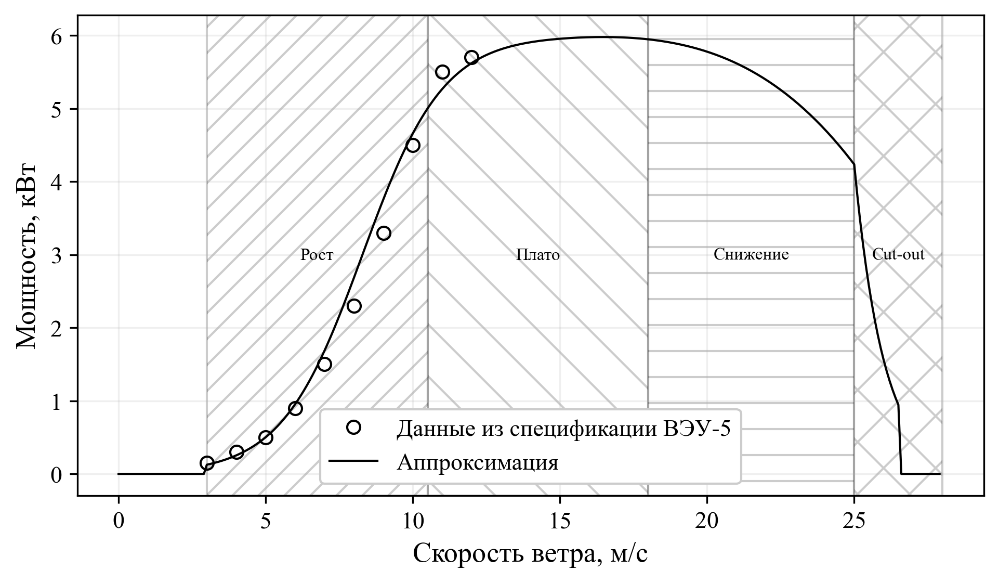

In [824]:
fig, ax = plt.subplots(figsize=figsize, dpi=300)

ws = np.arange(0, 28, 0.1)
power_curve = estimate_power_curve(3, 10.5, 5000, ws) / 1000

# Кривые
ax.plot(power_curve_points_5_kv / 1000, 'o', markerfacecolor='none', markeredgecolor='black', markersize=6)
ax.plot(ws, power_curve, color='black', linewidth=1)

# Зоны через заливку узором
ax.axvspan(3, 10.5, facecolor='none', hatch='//', edgecolor='black', alpha=0.2, label='Растущая мощность')
ax.axvspan(10.5, 18, facecolor='none', hatch='\\', edgecolor='black', alpha=0.2, label='Плато')
ax.axvspan(18, 25, facecolor='none', hatch='-', edgecolor='black', alpha=0.2, label='Снижение мощности')
ax.axvspan(25, 28, facecolor='none', hatch='x', edgecolor='black', alpha=0.2, label='Cut-out / остановка')

# Подписи зон
ax.text((10.5 + 3)/2, max(power_curve.values)/2, 'Рост', rotation=0, ha='center', va='center', fontsize=8)
ax.text((10.5 + 18)/2, max(power_curve.values)/2, 'Плато', rotation=0, ha='center', va='center', fontsize=8)
ax.text((18+25)/2, max(power_curve.values)/2, 'Снижение', rotation=0, ha='center', va='center', fontsize=8)
ax.text((25+28)/2, max(power_curve.values)/2, 'Cut-out', rotation=0, ha='center', va='center', fontsize=8)

ax.set_xlabel("Скорость ветра, м/с")
ax.set_ylabel("Мощность, кВт")
ax.legend(['Данные из спецификации ВЭУ-5', 'Аппроксимация'], framealpha=1)
ax.grid(alpha=0.2)

fig.savefig('../doc/figures/3_Аппроксимация мощности ВЭУ-5', bbox_inches='tight')


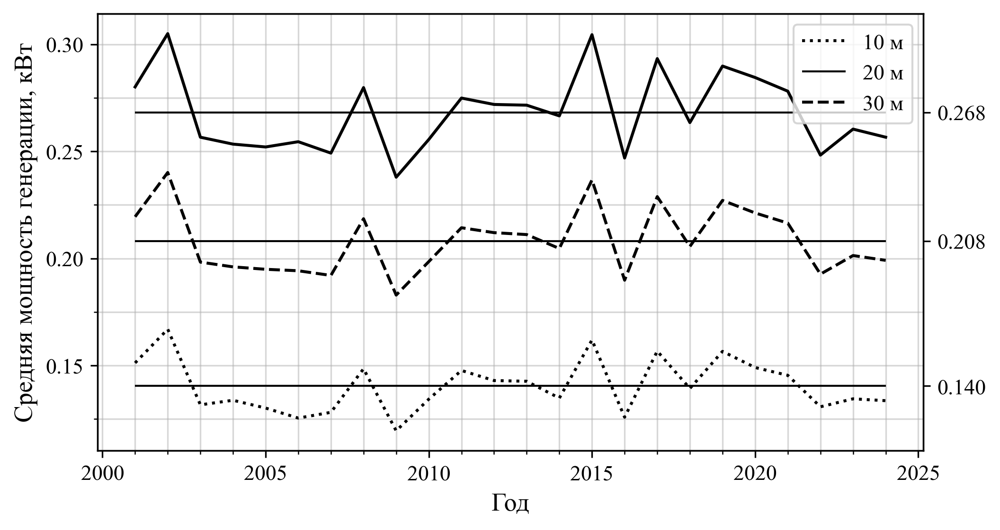

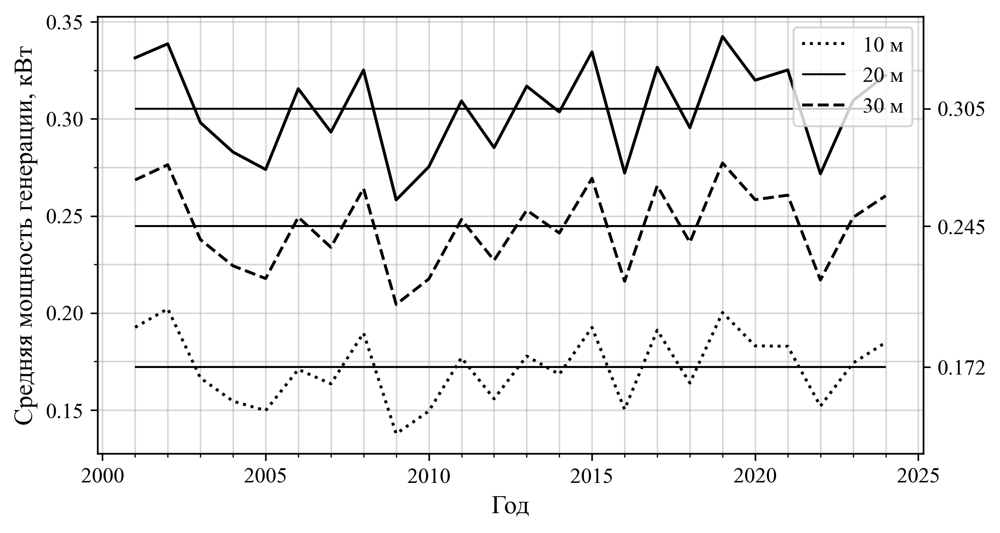

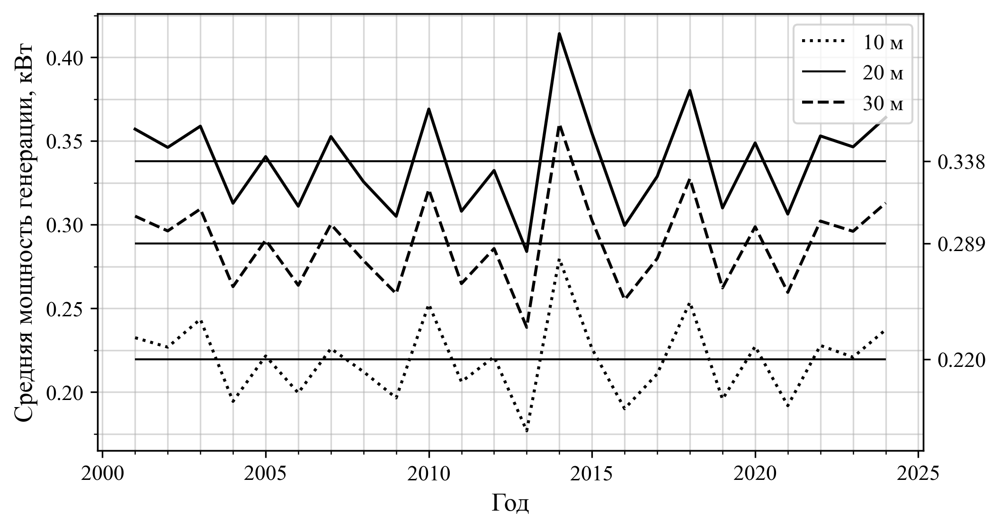

In [825]:
for city in power_data.city.values:
    da = power_data.sel(city=city, power_nominal=1000)
    da = da.groupby('time.year').mean(dim='time') / 1000
    years = da.year.values

    fig, ax = plt.subplots(figsize=figsize, dpi=300)

    mean_vals = []
    for h, style in zip([10, 20, 30], [':', '--', '-']):
        series = da.sel(height=h)
        mean_val = float(series.mean())
        mean_vals.append(mean_val)

        ax.plot(years, series, style+'k')
        ax.hlines(mean_val, xmin=2001, xmax=2024, color='k', linewidth=1)
    
    # Создаем вторую ось справа
    ax2 = ax.twinx()
    ax2.set_ylim(ax.get_ylim())
    ax2.set_yticks(mean_vals)
    ax2.set_yticklabels([f'{val:.3f}' for val in mean_vals])
    
    ax.legend(['10 м', "20 м", "30 м"], loc='upper right')
    ax.set_xlabel('Год')
    ax.set_ylabel('Средняя мощность генерации, кВт')
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.05))
    ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.05/2))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(1))

    ax.grid(which='minor', alpha=0.5)
    ax.grid(which='major', alpha=0.5)
    fig.savefig(f'../doc/figures/3_Средняя мощность генерации ВЭУ-1 в каждом году в городе {city}')

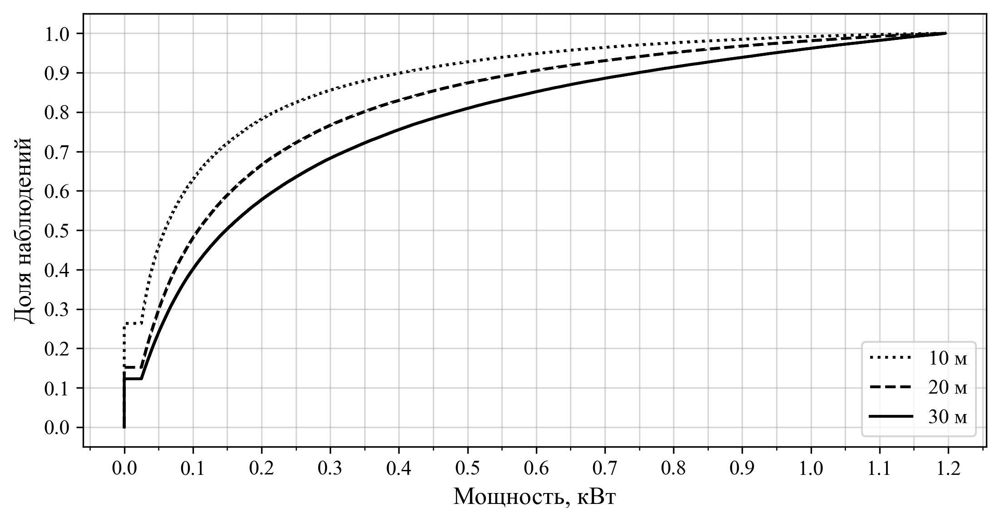

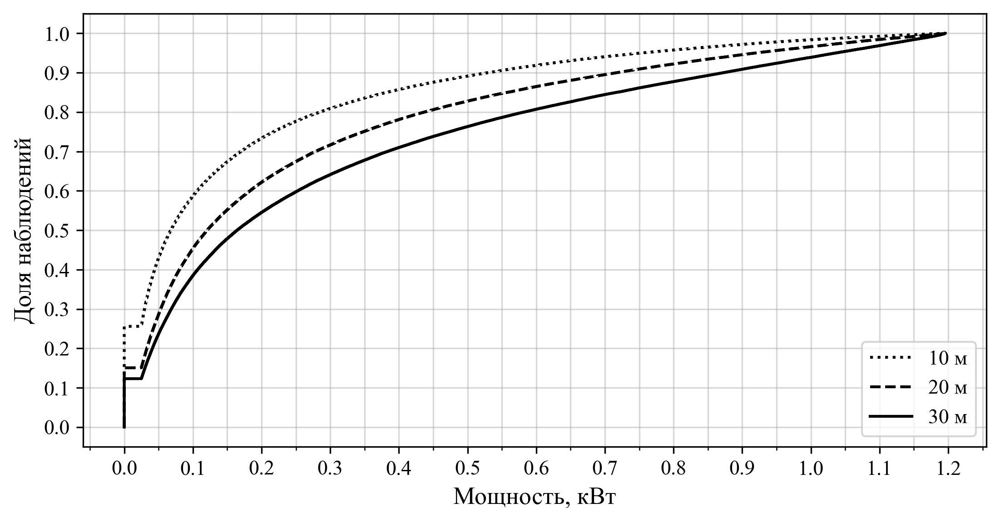

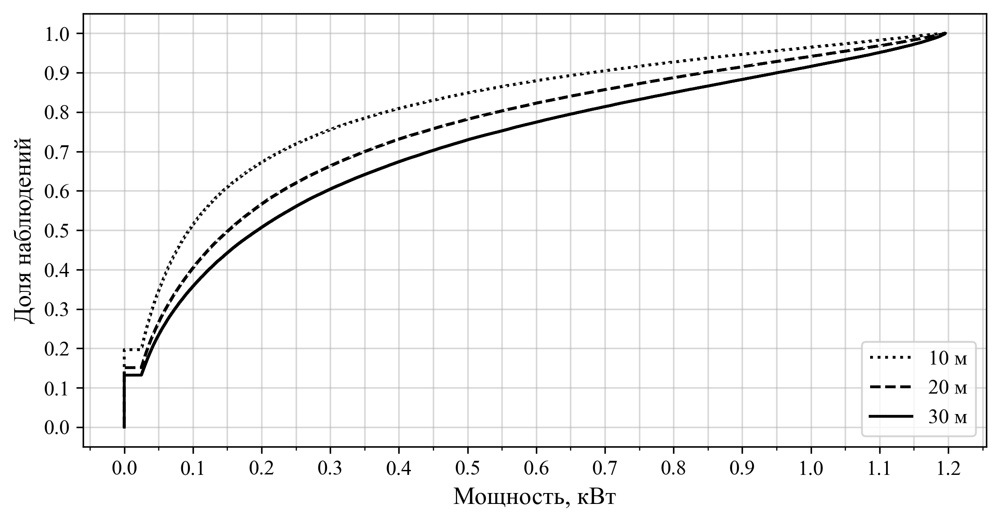

In [826]:
for city in power_data.city.values:    
    fig, ax = plt.subplots(figsize=figsize, dpi=300)

    da = power_data.sel(power_nominal=1000, city=city) / 1000

    for h, style in zip([10, 20, 30], [':', '--', '-']):
        df_sorted = np.sort(da.sel(height=h))
        y = np.linspace(0, 1, len(df_sorted))
        ax.plot(df_sorted, y, style+'k', label=f'{h} м') 

    ax.set_xlabel('Мощность, кВт')
    ax.set_ylabel('Доля наблюдений')
    ax.grid(which='major', alpha=0.5)
    ax.grid(which='minor', alpha=0.5)
    ax.legend(loc='lower right')
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))  
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    ax.xaxis.set_major_locator(ticker.MultipleLocator(0.1))
    plt.tight_layout()
    plt.savefig(f"../doc/figures/3_Эмпирическое распределение мощности ВЭУ-1 в городе {city}")

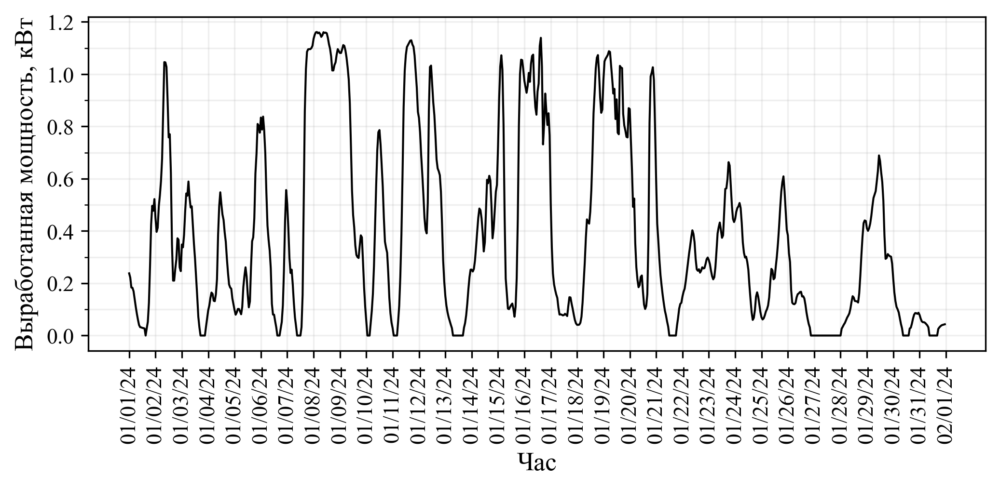

In [827]:
da = power_data.sel(power_nominal=1000, city='Таганрог', height=30, time=slice('01.01.2024', '31.01.2024')) / 1000

fig, ax = plt.subplots(figsize=(8, 3), dpi=300)
ax.plot(da.time, da, linewidth=1, color='black')

days = pd.date_range('2024-01-01', '2024-02-01', freq='D')
ax.set_xticks(days)
ax.set_xticklabels(days.strftime('%D'))
ax.set_xlabel("Час")
ax.set_ylabel("Выработанная мощность, кВт")
ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.1))
ax.tick_params(axis='x', rotation=90)
ax.grid(which='both', alpha=0.2)
plt.savefig('../doc/figures/3_Выработанная мощность за январь 2024 года c ВЭУ-1 в городе Таганрог',  bbox_inches='tight')

In [828]:
mean_power_hourly = power_data.groupby('time.hour').mean()
median_power_hourly = power_data.groupby('time.hour').quantile(0.5)

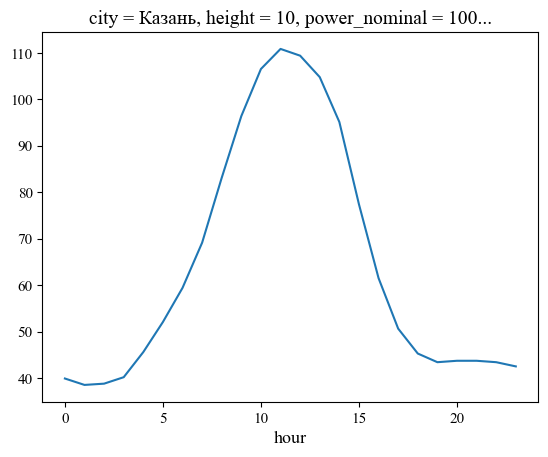

In [829]:
median_power_hourly.sel(power_nominal=1000, city='Казань', height=10).plot()

## Моделирование работы аккумулятора

### Функции, которые нам понадобятся

In [831]:
simulation_data = simulate_battery_system_xr(
    power_data,
    hourly_consumption,
    xr.DataArray(np.hstack([np.array([0]), np.arange(3000, 30000+1, 3000)]), dims='battery_cap'),
    initial_charge=0,
    max_supplied=3000,
    supplied_efficiency=0.95,
    battery_loss=0.005
)

### Вычисление, графики

In [835]:
def plot_color_graph(da, cbar_label, graph_name_template, height=20, decimal_places=2):
    for city in da.city.values:
        fig, ax = plt.subplots(figsize=figsize, dpi=500)

        graph = (
            da.sel(city=city, height=height)
            .assign_coords(
                power_nominal=da.power_nominal / 1000,
                battery_cap=da.battery_cap  / 1000
            )
        )
        x_vals = graph.battery_cap.values
        y_vals = graph.power_nominal.values
        
        graph.plot(ax=ax, cbar_kwargs={"label": cbar_label})
        ax.set_xticks(x_vals)
        ax.set_xticklabels([f"{val:.0f}" for val in x_vals])
        ax.set_yticks(y_vals)
        ax.set_yticklabels([f"{val:.0f}" for val in y_vals])

        ax.set_xlabel('Емкость батареи, кВт')
        ax.set_ylabel('Номинальная мощность, кВт')
        ax.set_title('')
        for y in graph.power_nominal.values:
            for x in graph.battery_cap.values:
                val = graph.sel(power_nominal=y, battery_cap=x).item()
                ax.text(
                    x, y, f"{val:.{decimal_places}f}",
                    ha="center", va="center",
                    fontsize=6,
                    color="black",
                    path_effects=[
                        pe.Stroke(linewidth=1.2, foreground="white"),
                        pe.Normal()
                    ]
                )

        fname = graph_name_template.format(city=city, height=height)
        fig.tight_layout(rect=[0, 0.02, 1, 1])    
        fig.savefig(fname, bbox_inches="tight")

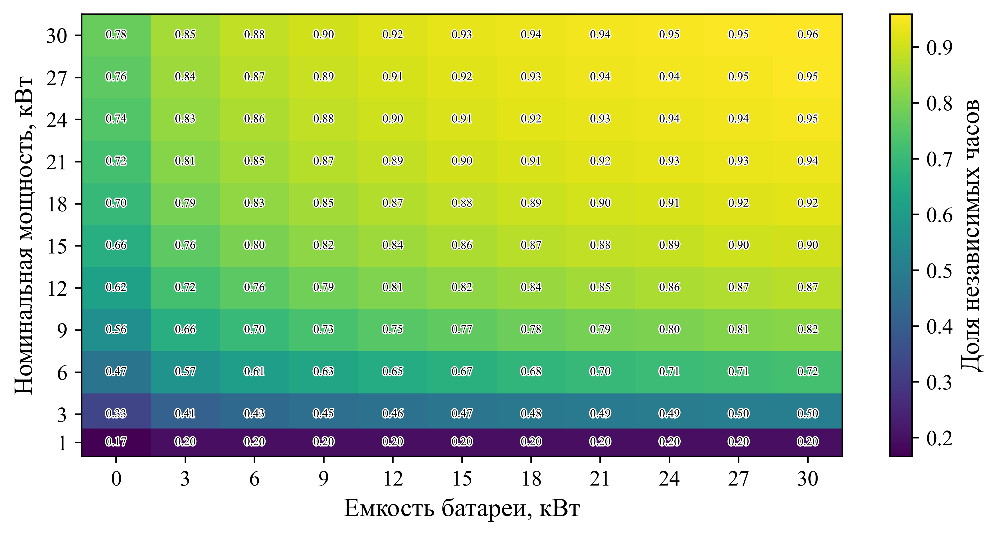

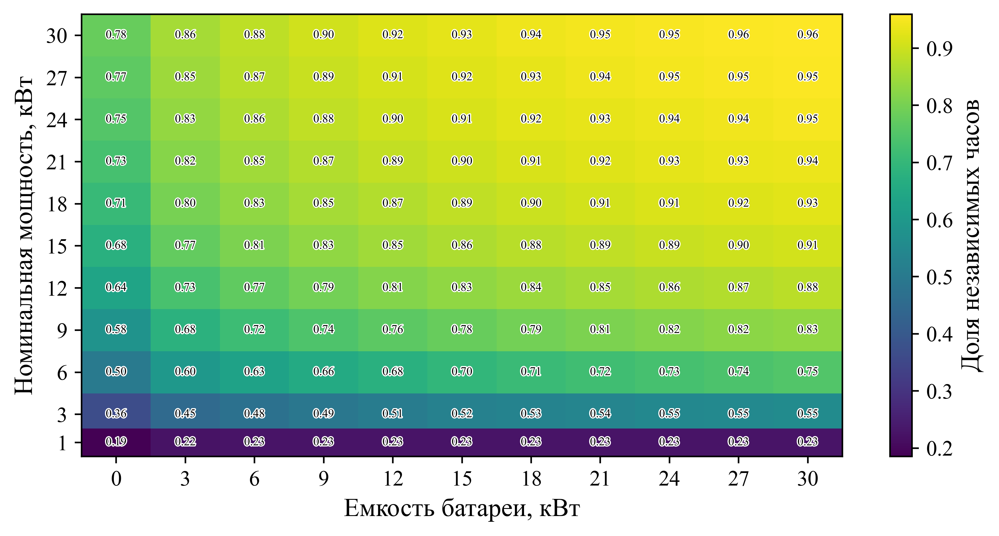

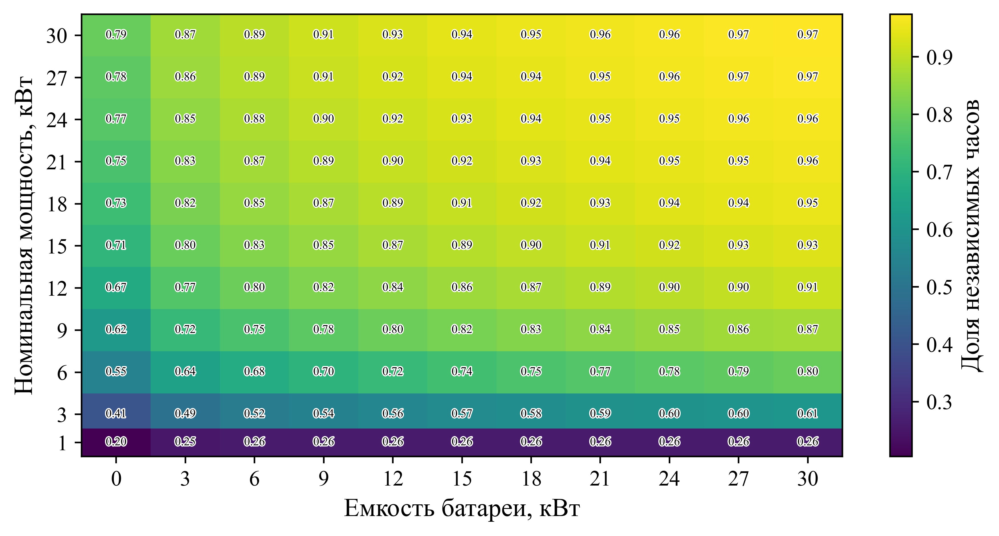

In [837]:
part_independent_hours = (
    simulation_data.independent_hours
    .sum("time")
) / (365 * 24 * 24)

plot_color_graph(
    part_independent_hours, 
    'Доля независимых часов', 
    '../doc/figures/4_Доля независимых часов на высоте {height} м для города {city}',
    height=20
)

In [839]:
part_energy_consumption = (
    simulation_data.total_consumption / (24 * 365 * consumption_curve.sum()) 
) 

plot_color_graph(
    part_energy_consumption, 
    "Доля покрытия энергопотребления", 
    '../doc/figures/4_Доля покрытия энергопотребления на высоте {height} м для города {city}', 
    height=20,
)

NameError: name 'consumption_curve' is not defined

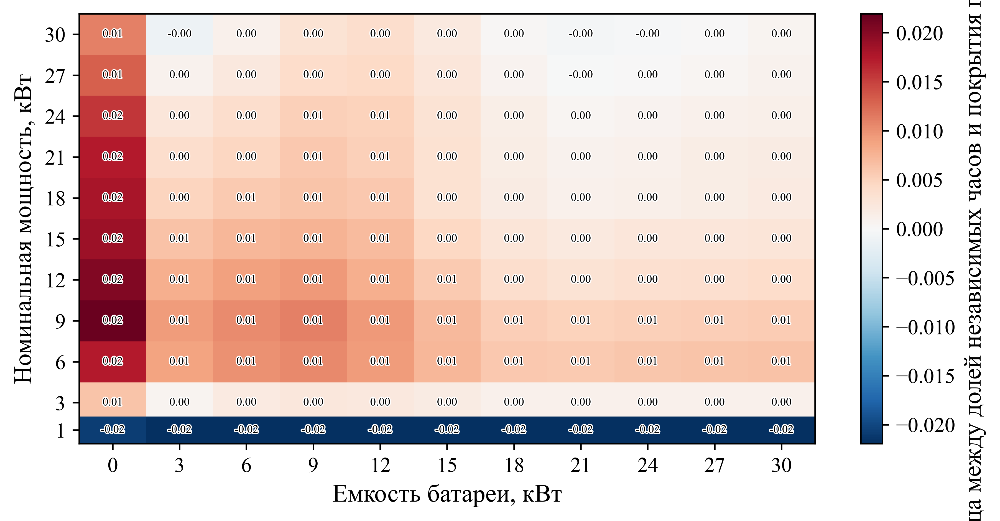

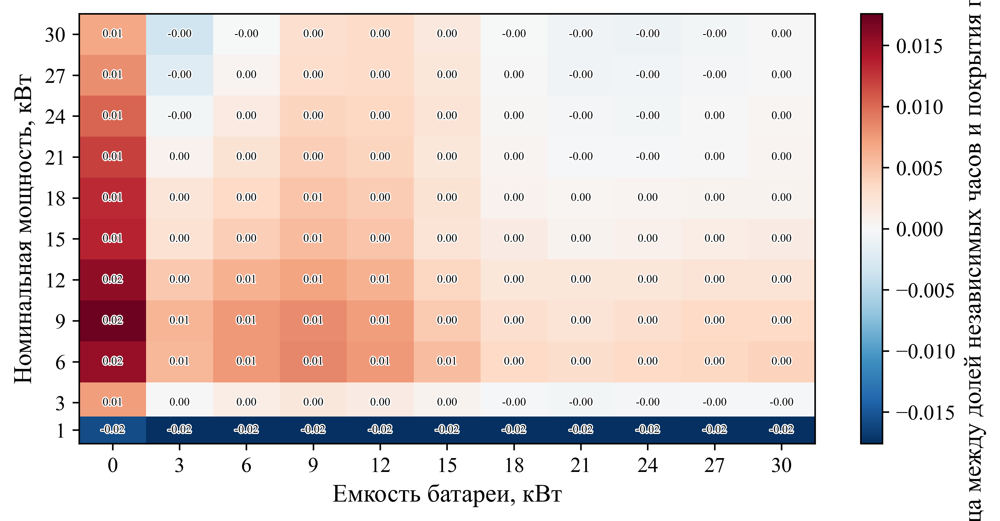

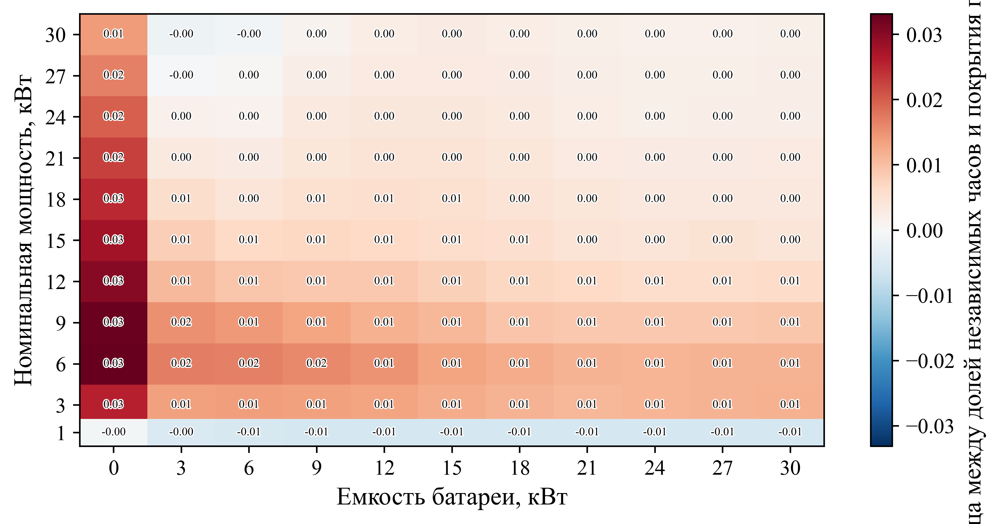

In [237]:
plot_color_graph(
    (part_energy_consumption - part_independent_hours), 
    "Разница между долей независимых часов и покрытия потребления", 
    '../doc/figures/4_Разница между долей независимых часов и покрытия потребления на высоте {height} м для города {city}', 
    height=10,
)

In [840]:
part_monthly_independent_hours = (
    simulation_data
    .independent_hours
    .groupby('time.month')
    .sum(dim='time')
) / simulation_data.time.groupby('time.month').count(dim='time')

In [841]:
def plot_color_graph_monthly(da, cbar_label, graph_name_template, height=20, battery_cap=6000, decimal_places=2):
    for city in da.city.values:
        fig, ax = plt.subplots(figsize=figsize, dpi=500)

        graph = (
            da.sel(city=city, height=height, battery_cap=battery_cap)
            .assign_coords(
                power_nominal=da.power_nominal / 1000,
            )
        )
        x_vals = graph.month.values
        y_vals = graph.power_nominal.values
        
        graph.plot(ax=ax, cbar_kwargs={"label": cbar_label})
        ax.set_xticks(x_vals)
        ax.set_xticklabels([f"{val:.0f}" for val in x_vals])
        ax.set_yticks(y_vals)
        ax.set_yticklabels([f"{val:.0f}" for val in y_vals])

        ax.set_xlabel('Месяц, кВт')
        ax.set_ylabel('Номинальная мощность, кВт')
        ax.set_title('')
        for y in y_vals:
            for x in x_vals:
                val = graph.sel(power_nominal=y, month=x).item()
                ax.text(
                    x, y, f"{val:.{decimal_places}f}",
                    ha="center", va="center",
                    fontsize=6,
                    color="black",
                    path_effects=[
                        pe.Stroke(linewidth=1.2, foreground="white"),
                        pe.Normal()
                    ]
                )

        fname = graph_name_template.format(city=city, height=height, battery_cap=battery_cap)
        fig.tight_layout(rect=[0, 0.02, 1, 1])    
        fig.savefig(fname, bbox_inches="tight")

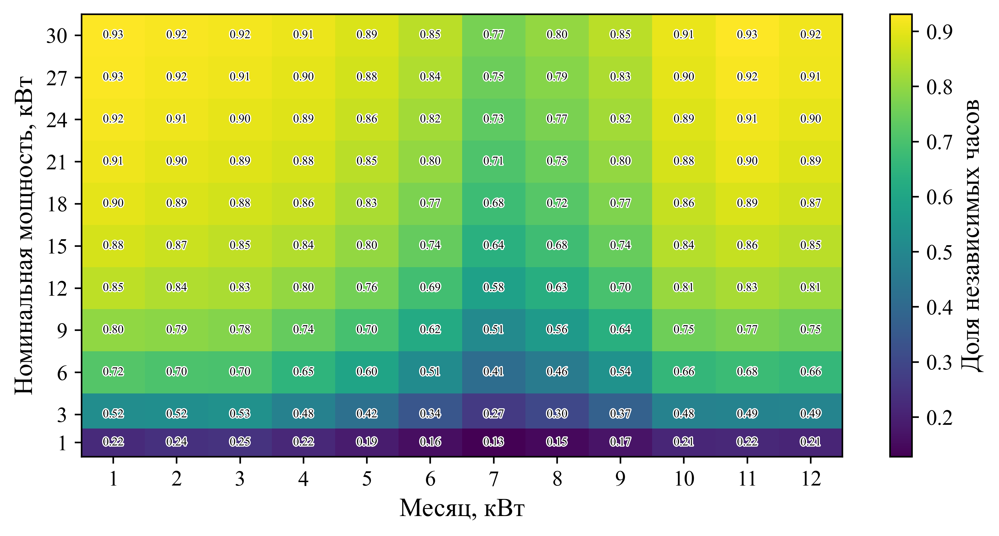

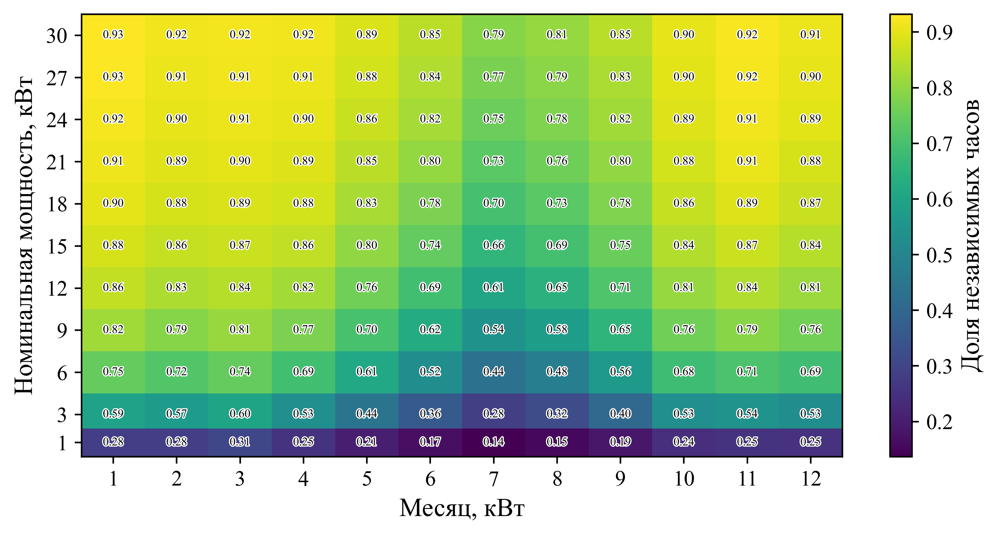

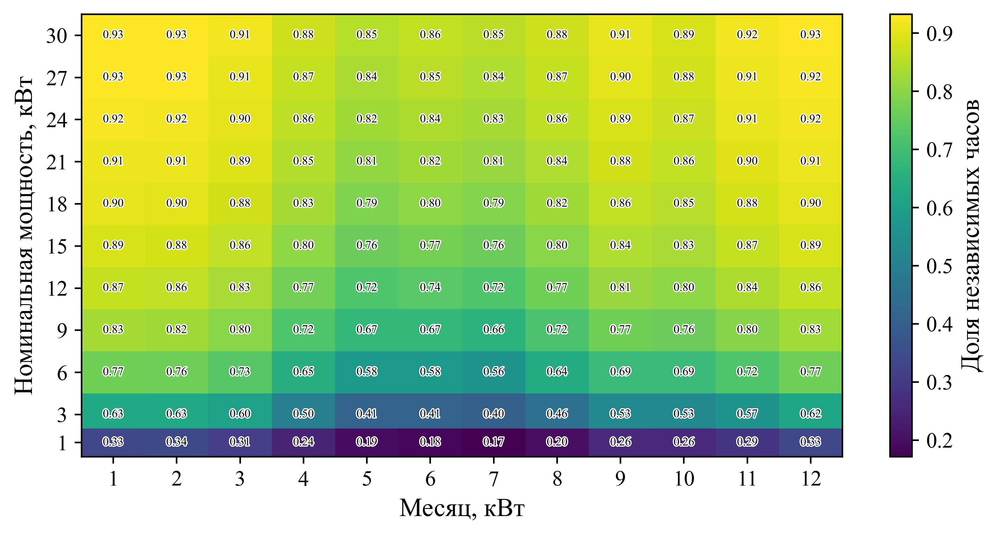

In [843]:
plot_color_graph_monthly(
    part_monthly_independent_hours,
    'Доля независимых часов', 
    '../doc/figures/4_Доля независимых часов на высоте {height} м для города {city} при объеме батареи {battery_cap} кВт*ч по месяцам',
    height=20,
    battery_cap=6000
)

## Определение мощности и занимаемой площади ВЭУ

In [93]:
E_hour = E_day / 24
P_sp = E_hour / 1
v_wind = 4
P_peak_wpi = 300
E_day_wpi = 7200
number_of_wpi = 4
type_wpi_from_table = 'ВЭУ-5'
print(f'Среднее скорость ветра {v_wind} м/с')
print(f'Выбран {type_wpi_from_table}')

Среднее скорость ветра 4 м/с
Выбран ВЭУ-5


In [94]:
d = 0.18
S_m = math.pi * (d/2) ** 2
teta = 25
h = 10
D = 2 * h * math.tan(teta * math.pi / 180)
S = D**2 / 2
print(f'Площадь одной ВЭС {S:.0f} м^2')

Площадь одной ВЭС 43 м^2


## Аэродинамические параметры ВЭУ

### Расчет параметров ротора ВЭУ

In [95]:
type_wpi = 'вертикальная'
P_nominal = 5000
v_nominal = 11
P_a = P_nominal / 0.593
S = 2 * P_a / (1.2041 * v_nominal**3)
S *= 1.33

H = 3
D = S / H

rotor_info = pd.Series([H, D], index=['H', 'D']).round(2)
rotor_info

H    3.00
D    4.66
dtype: float64

### Расчет параметров лопастей ротора ВЭУ

In [96]:
Z = 2
R_e_min = 200000
v = 11 # м/с


n = round(4 * math.pi / Z)

w_min = 60 * Z * v / (np.pi *  D)
w_sec = w_min / 60

b = 16 * math.pi * (D / 2) / (9 * Z**2 * n)

R_e_stab = 68500 * Z * v * b

L = H

beta = math.atan(2/(3*Z)) - 5


blade_info = pd.Series(
    [Z, n, w_sec, b, R_e_stab, L, beta], 
    index=[
        'Быстроходность Z', 
        'Число лопастей n', 
        'Номинальная частота вращения, Гц', 
        'Длина хорды, м', 
        'Оптимальное число Рейнольдса',
        'Длина лопасти',
        'Установочный угол лопасти'
    ]
).round(2)
blade_info

Быстроходность Z                         2.00
Число лопастей n                         6.00
Номинальная частота вращения, Гц         1.50
Длина хорды, м                           0.54
Оптимальное число Рейнольдса        817964.47
Длина лопасти                            3.00
Установочный угол лопасти               -4.68
dtype: float64

In [97]:
print(blade_info.to_latex(float_format=lambda x: f"{x:.2f}".rstrip('0').rstrip('.')))

\begin{tabular}{lr}
\toprule
 & 0 \\
\midrule
Быстроходность Z & 2 \\
Число лопастей n & 6 \\
Номинальная частота вращения, Гц & 1.5 \\
Длина хорды, м & 0.54 \\
Оптимальное число Рейнольдса & 817964.47 \\
Длина лопасти & 3 \\
Установочный угол лопасти & -4.68 \\
\bottomrule
\end{tabular}



## Расчет генератора ВЭУ

In [98]:
m = 3
dF_da = 1.574*1e-3
w_e = 339.292 
w = 324
emf_peak = 173
emf_ms = 123
emf_gen = 213
L_f = 0.25
Q = 1.767 * 1e-6
p_CU = 0.017*1e-6
R_f = 0.966
I_max = 110

generator_info = pd.Series(
    [m, dF_da, w_e, w, emf_peak, emf_ms, emf_gen, L_f, Q, p_CU, R_f, I_max],
    index=[
        'кол-во фаз', 
        'амплитуда производной магнитного потока',
        'частота вращения в электрических радианах',
        'кол-во витков в фазе',
        'Амплитуда фазовой ЭДС',
        'Средне квадратическое значение ЭДС одной фазы',
        'Средне квадратическое значение ЭДС генератора',
        'Длинна проводника',
        'Сечение проводника',
        'Удельное сопротивление меди',
        'Сопротивление фазы',
        'Максимальный ток генератора'
    ]
)
generator_info

кол-во фаз                                       3.000000e+00
амплитуда производной магнитного потока          1.574000e-03
частота вращения в электрических радианах        3.392920e+02
кол-во витков в фазе                             3.240000e+02
Амплитуда фазовой ЭДС                            1.730000e+02
Средне квадратическое значение ЭДС одной фазы    1.230000e+02
Средне квадратическое значение ЭДС генератора    2.130000e+02
Длинна проводника                                2.500000e-01
Сечение проводника                               1.767000e-06
Удельное сопротивление меди                      1.700000e-08
Сопротивление фазы                               9.660000e-01
Максимальный ток генератора                      1.100000e+02
dtype: float64

In [99]:
I = np.arange(0, 110, 0.5)
U = emf_gen - I * R_f * (m - 1)
P_el = I ** 2 * R_f * (m - 1)
P_2 = U * I
P_1 = emf_gen * I
eta = P_2 / P_1
J = I / Q

/var/folders/9x/nyv19fds7_l7nxsmm3nncr0h0000gn/T/ipykernel_27440/721838946.py:6: RuntimeWarning: invalid value encountered in divide
  eta = P_2 / P_1


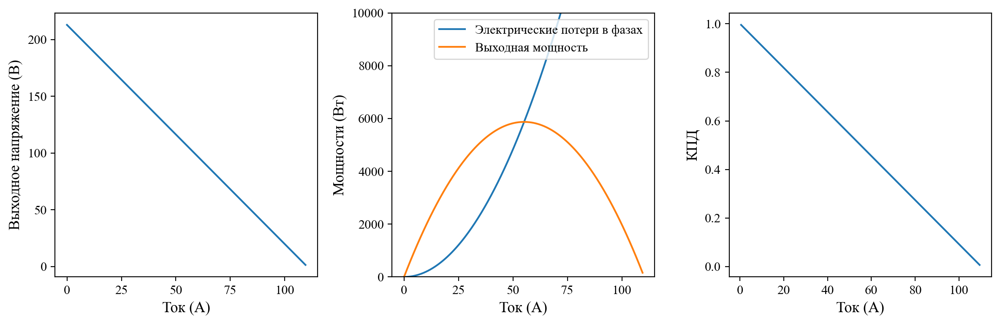

In [100]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=200)
axs = axs.flatten()

axs[0].plot(I, U)
axs[0].set_xlabel('Ток (А)')
axs[0].set_ylabel('Выходное напряжение (В)')

axs[1].plot(I, P_el, label='Электрические потери в фазах')
axs[1].plot(I, P_2, label='Выходная мощность')
axs[1].set_ylim(0, 10000)
axs[1].set_xlabel('Ток (А)')
axs[1].set_ylabel('Мощности (Вт)')
axs[1].legend()

axs[2].plot(I, eta)
axs[2].set_xlabel('Ток (А)')
axs[2].set_ylabel('КПД')

plt.tight_layout()

## Выбор типа инвертора ВЭУ

In [101]:
appliance_usage_patterns['Работают на синусоидальном режиме'] = [
    True, True, True, True, True, False, True, True, False, True, True, False, False, True, False 
]

In [102]:
aup_sin = appliance_usage_patterns.loc[appliance_usage_patterns['Работают на синусоидальном режиме'] == True, columns]
aup_no_sin = appliance_usage_patterns.loc[appliance_usage_patterns['Работают на синусоидальном режиме'] == False, columns]
print(aup_sin)
print()
print(aup_no_sin)

          Электроприборы    Вт  Утро  День  Вечер  Ночь
0              Телевизор   300     0   300    300   300
1       Освещение внутри   300   300     0    300   300
2      Освещение снаружи   200     0     0    200   200
3                  Насос   700   700   700    700   700
4   Строительные приборы  2000     0  2000      0     0
6                Ноутбук   180   180   180    180   180
7              Компьютер   650   650   650    650   650
9                    Фен  1800  1800     0      0  1800
10           Холодильник   150   150   150    150   150
13     Стиральная машина  1500  1500     0      0     0

             Электроприборы    Вт  Утро  День  Вечер  Ночь
5                      Утюг  2000  2000     0   2000  2000
8        Микроволновая печь  1200  1200  1200   1200  1200
11  Другие кухонные приборы  1000     0     0   1000  1000
12                  Телефон    45    45    45     45    45
14           Другие приборы   300   300   300    300   300


In [103]:
P_dayparts_sin = pd.Series({period: aup_sin.loc[aup_sin[period] > 0, 'Вт'].sum() for period in periods})
P_dayparts_no_sin = pd.Series({period: aup_no_sin.loc[aup_no_sin[period] > 0, 'Вт'].sum() for period in periods})
print(P_dayparts_sin)
print()
print(P_dayparts_no_sin)

Утро     5280
День     3980
Вечер    2480
Ночь     4280
dtype: int64

Утро     3545
День     1545
Вечер    4545
Ночь     4545
dtype: int64


In [104]:
print(P_dayparts_sin.max())
print(P_dayparts_no_sin.max())

5280
4545


In [105]:
P_dayparts_max

8825

In [106]:
print(P_dayparts_sin.max())
print(P_dayparts_no_sin.max())

5280
4545


In [107]:
consumption_curve.max() * 1.5

np.float64(2370.375)

## Экономический расчет

### Получаем оценки зависимости стоимости разных частей установки

In [691]:
mast_data['cost'] = mast_data['cost'] * 1.2 # include vat. because in china.
df = mast_data.copy()

X = np.log(df[['h', 'power']].values)
y = np.log(df['cost'].values)

model = LinearRegression()
model.fit(X, y)

alpha_mast, beta_mast = model.coef_
log_c0 = model.intercept_
c0_mast = np.exp(log_c0)
printl(rf'cost = {{{c0_mast:.0f}}} \cdot h^{{{alpha_mast:.3f}}} \cdot power^{{{beta_mast:.3f}}}')
def predict_mast_cost(h, power):
    return c0_mast * h ** alpha_mast * power ** beta_mast

<IPython.core.display.Math object>

In [692]:
generator_data['cost'] *= 1.2 #include vat. because in china.
x = generator_data['power']
y = generator_data['cost']
log_x = np.log(x)
log_y = np.log(y)

alpha_generator, log_c0_generator = np.polyfit(log_x, log_y, 1)
c0_generator = np.exp(log_c0_generator)

def predict_generator_cost(power):
    return c0_generator * power ** alpha_generator

In [693]:
x = inverter_data['power']
y = inverter_data['cost']
log_x = np.log(x)
log_y = np.log(y)

alpha_inverter, log_c0_inverter = np.polyfit(log_x, log_y, 1)
c0_inverter = np.exp(log_c0_inverter)

def predict_inverter_cost(power):
    return c0_inverter * power ** alpha_inverter

In [694]:
controller_data['cost'] *= 1.2 #include vat. because in china.
x = controller_data['power']
y = controller_data['cost']
log_x = np.log(x)
log_y = np.log(y)

alpha_controller, log_c0_controller = np.polyfit(log_x, log_y, 1)
c0_controller = np.exp(log_c0_controller)

def predict_controller_cost(power):
    return c0_controller * power ** alpha_controller

### Строим промежуточные графики

In [695]:
def plot_fit_data(func, x, y, label, xlabel, ylabel, path):
    plt.figure(figsize=figsize, dpi=500)
    x_fit = np.linspace(x.min(), x.max(), 200)
    y_fit = func(x_fit)
    plt.scatter(x, y, facecolors='none', edgecolors='black', s=36, label='Данные из интернета')
    plt.plot(x_fit, y_fit, color='k', label=label)
    plt.legend()
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xscale('log')
    plt.yscale('log')
    plt.grid(True, which='major', linestyle=':', linewidth=0.5)
    plt.grid(True, which='minor', linestyle=':', linewidth=0.5)
    plt.savefig(path, bbox_inches='tight')

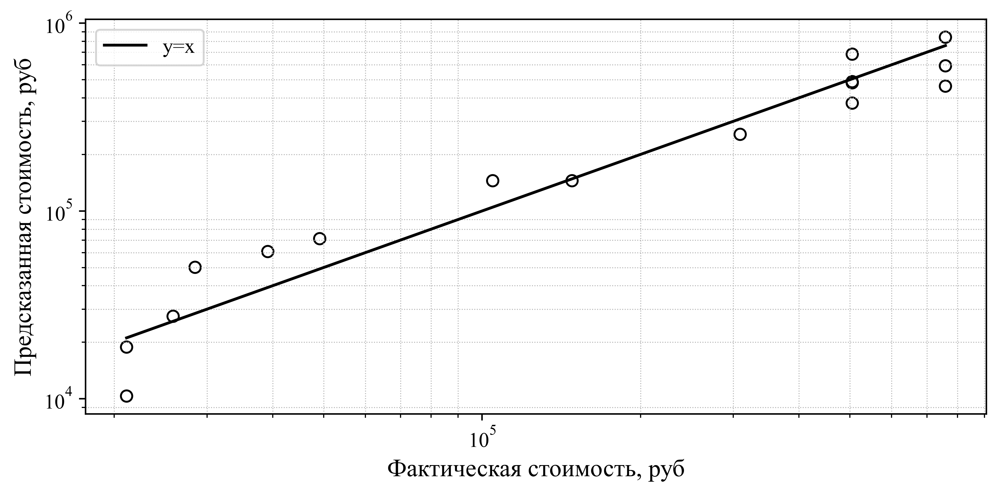

In [696]:
plt.figure(figsize=figsize, dpi=500)
plt.scatter(
    df['cost'], 
    predict_mast_cost(df['h'].values, df['power'].values), 
    facecolors='none', edgecolors='k'
)
plt.plot(
    [df['cost'].min(), df['cost'].max()],
    [df['cost'].min(), df['cost'].max()],
    'k',
    label='y=x'
)
plt.xlabel("Фактическая стоимость, руб")
plt.ylabel("Предсказанная стоимость, руб")
plt.xscale('log')
plt.yscale('log')
plt.grid(True, which='minor', linestyle=':', linewidth=0.5)
plt.legend()
plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig('../doc/figures/6_Оценка качества интерполяции стоимости мачты')

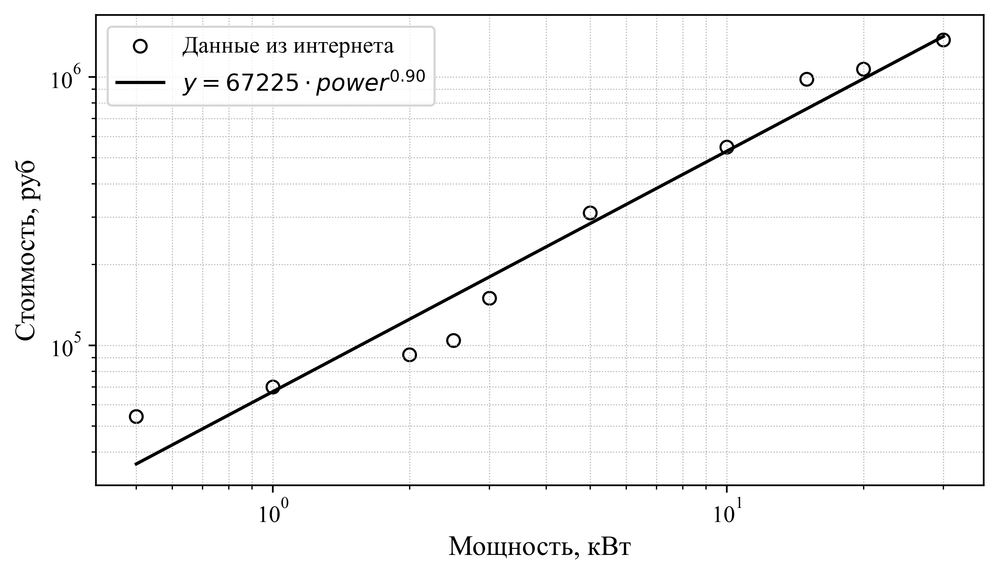

In [697]:
plot_fit_data(
    predict_generator_cost, 
    generator_data['power'].values, 
    generator_data['cost'].values,
    xlabel='Мощность, кВт',
    ylabel='Стоимость, руб',
    label=rf'$y={{{c0_generator:.0f}}} \cdot power^{{{alpha_generator:.2f}}}$',
    path='../doc/figures/6_Аппроксимация стоимости ветрогенератора'
)


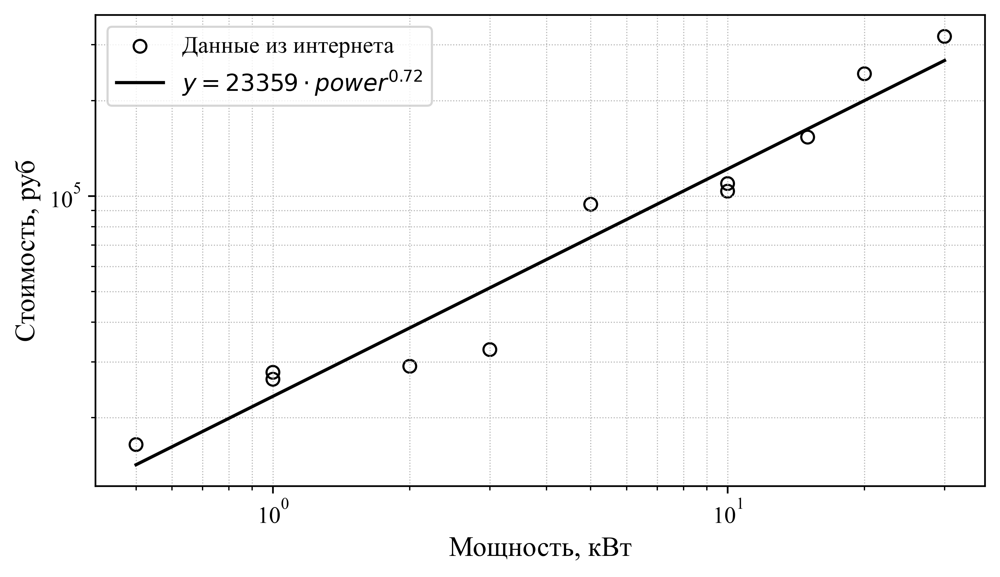

In [698]:
plot_fit_data(
    predict_controller_cost, 
    controller_data['power'].values, 
    controller_data['cost'].values,
    xlabel='Мощность, кВт',
    ylabel='Стоимость, руб',
    label=rf'$y={{{c0_controller:.0f}}} \cdot power^{{{alpha_controller:.2f}}}$',
    path='../doc/figures/6_Аппроксимация стоимости контроллера'
)


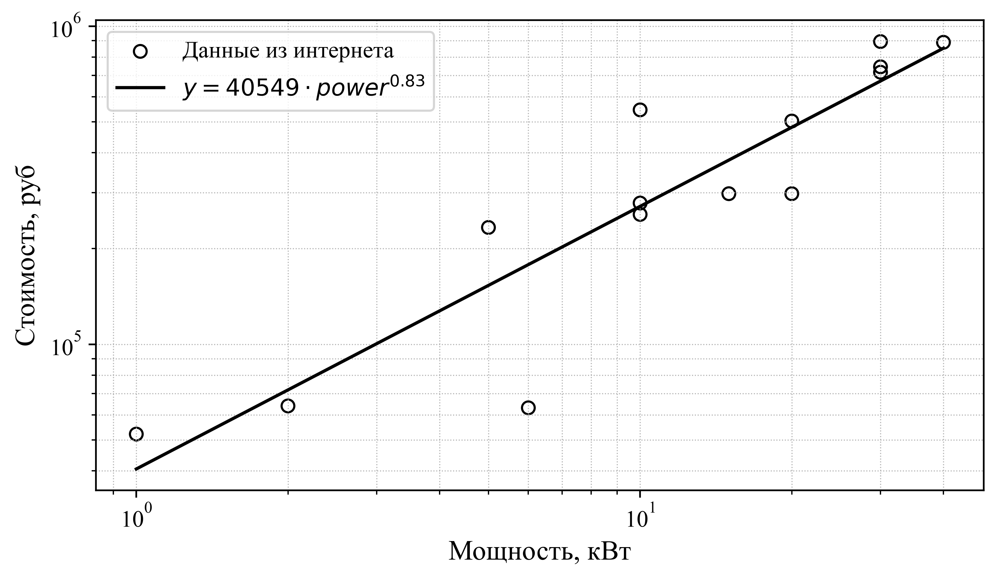

In [699]:
plot_fit_data(
    predict_inverter_cost, 
    inverter_data['power'].values, 
    inverter_data['cost'].values,
    xlabel='Мощность, кВт',
    ylabel='Стоимость, руб',
    label=rf'$y={{{c0_inverter:.0f}}} \cdot power^{{{alpha_inverter:.2f}}}$',
    path='../doc/figures/6_Аппроксимация стоимости инвертора'
)


### Получаем данные стоимости ветроустановки

In [844]:
def get_cost_info(
        power,
        height,
        battery_cap,
        
        f_trans=0.08,    # Транспортировка
        f_trans_ch=0.15, # Транспортировка
        f_inst=0.08,     # Установка
        f_cont=0.10,     # Непредвиденные расходы
        f_ser=0.15,      # Обслуживание

        C_perm_fix=50000,
        C_battery_per_kwk=25_000,

        info=False
):
    C_generator = predict_generator_cost(power / 1000) 
    C_controller = predict_controller_cost(power / 1000)
    C_mast = predict_mast_cost(height, power / 1000)
    C_inverter = predict_inverter_cost(power / 1000) 
    C_battery = C_battery_per_kwk * battery_cap / 1000

    C_equipment = (C_generator + C_controller + C_mast + C_inverter + C_battery)
    C_trans_ch = (C_generator + C_controller + C_mast) * f_trans_ch
    C_trans_lo = (C_inverter + C_battery) * f_trans
    C_trans = C_trans_ch + C_trans_lo
    C_inst = C_equipment * f_inst
    C_cont = C_equipment * f_cont
    C_ser = C_equipment * f_ser

    total = (C_equipment + C_trans + C_inst + C_cont + C_ser)
    
    info_df = None
    if info:
        data = [
                ["Генератор", C_generator],
                ["Контроллер", C_controller],
                ["Мачта", C_mast],
                ["Инвертор", C_inverter],
                ["Аккумуляторы", C_battery],
                ["Доставка из Китая", C_trans_ch],
                ["Локальная транспортировка", C_trans_lo],
                ["Монтаж", C_inst],
                ["Непредвиденные расходы", C_cont],
                ["Обслуживание", C_ser],
                ["Разрешения / проект", C_perm_fix],
                ["Цена за кВт, руб/кВт", 1000 * total / power],
                ["ИТОГО", total],
        ]

        info_df = pd.DataFrame(
                data,
                columns=["Статья затрат", "Стоимость, руб"]
        )

        info_df["Стоимость, руб"] = info_df["Стоимость, руб"].round(0).astype(int)

    return total, info_df

In [845]:
total, df = get_cost_info(30000, 20, 15000, info=True)

In [846]:
df['Стоимость, руб'] = df['Стоимость, руб'].apply(
    lambda x: f"{int(x):,}"
)

In [744]:
df_to_latex(df, '6_wpi_price_estimate', 'Оценка стоимости разных компонентов ВЭУ')

In [847]:
sale_kwh = 2.5
buy_kwh = 6

cost_wpi, _ = get_cost_info(
    power=simulation_data.power_nominal,
    height=simulation_data.height,
    battery_cap=simulation_data.battery_cap
)

total_cons_kwh_per_year = simulation_data.total_consumption.sel(height=30, power_nominal=15000, battery_cap=6000) / (1000 * 24) 
total_excess_kwh_per_year = simulation_data.total_excess.sel(height=30, power_nominal=15000, battery_cap=6000) / (1000 * 24) 

annual_profit = (
    total_cons_kwh_per_year * buy_kwh
    + total_excess_kwh_per_year * sale_kwh
)

payback_data = cost_wpi / annual_profit

In [849]:
(simulation_data.independent_hours.sum(dim='time') / (24 * 365 * 24)).sel(city='Набережные Челны', height=20, power_nominal=9000, battery_cap=6000)

<xarray.DataArray 'independent_hours' ()> Size: 8B
array(0.71631469)
Coordinates:
    power_nominal  int64 8B 9000
    city           <U16 64B 'Набережные Челны'
    height         int64 8B 20
    battery_cap    int64 8B 6000

### Графики

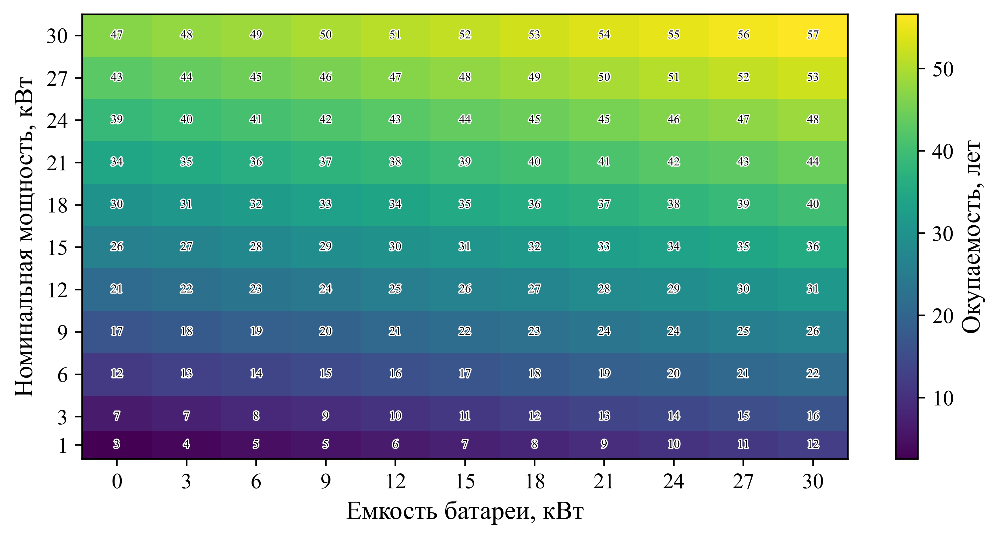

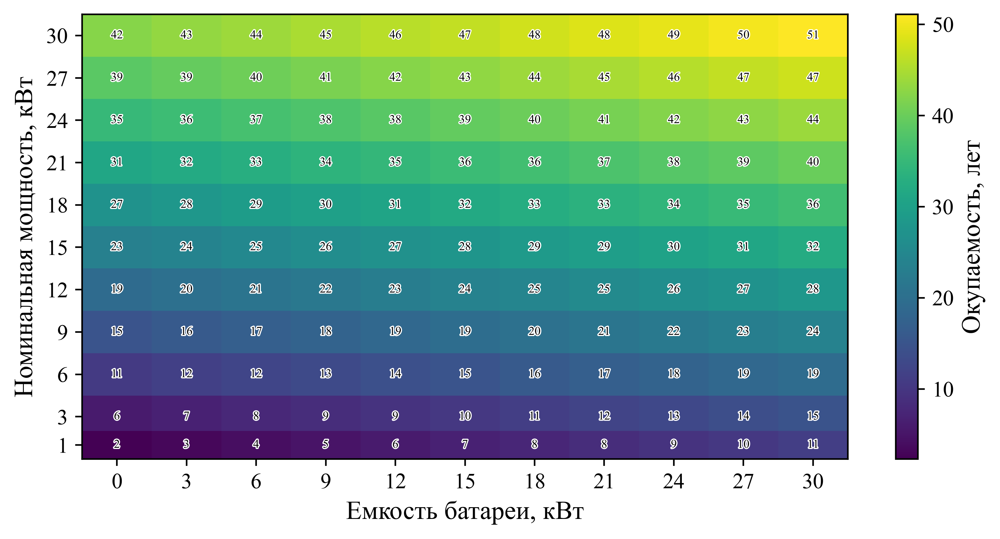

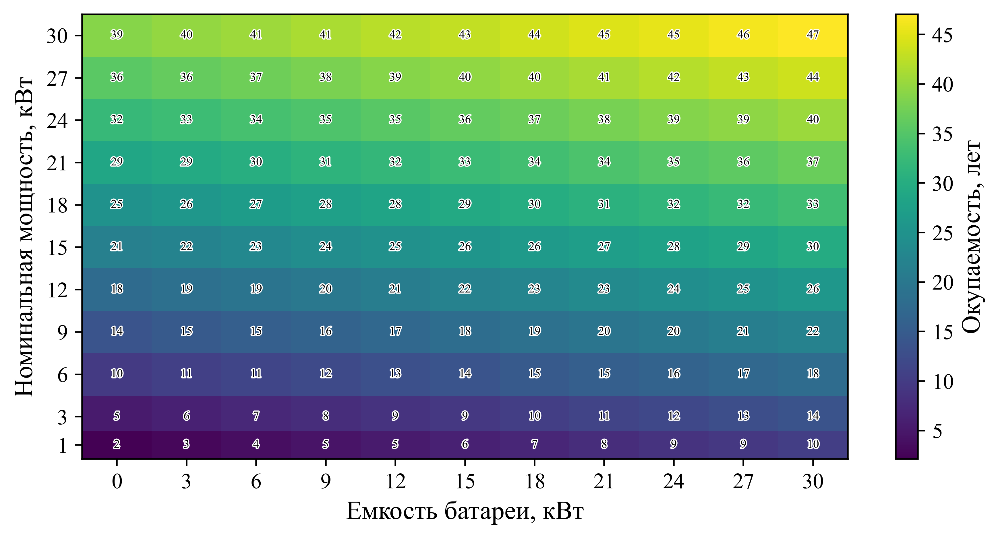

In [852]:
da = payback_data

plot_color_graph(da, "Окупаемость, лет", '../doc/figures/6_Окупаемость при высоте башни {height} м в городе {city}', decimal_places=0, height=20)